### Описание проекта

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

Для начала они просят вас — аналитика — подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.
Постарайтесь сделать презентацию информативной и лаконичной. Её структура и оформление сильно влияют на восприятие информации читателями вашего исследования. Выбирать инструменты (matplotlib, seaborn и другие) и типы визуализаций вы можете самостоятельно.

Вам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

### Загрузка данных

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from numpy import median
import folium
import json
from folium import Map, Choropleth
from folium import Map, Marker
from folium.plugins import MarkerCluster
from plotly import graph_objects as go

In [2]:
data = pd.read_csv('/datasets/moscow_places.csv')
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [3]:
display(data.head())

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


- В исходном файле представлена информация о 8406 заведениях общепита в Москве. Для всех заведений указаны наименование, категория, адрес, район, координаты, рейтинг и принадлежность к сети. В остальных столбцах есть пропуски связанные как с отсутствием данных, так и невозможностью указать для определенной категории общепита один из параметров таблицы. Например, значение middle_coffee_cup для пиццерии.
- Формат данных для столбцов с текстовыми данными - object, для числовых данных - float64, целочисленные данные int64 в столбце chain.

### Предобработка данных

In [4]:
#проверяем базу данных на явные дубликаты
print(data.duplicated().sum())

0


In [5]:
#проверим таблицу на пропуски в данных
print(data.isna().sum())

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64


- Исходя из данных таблицы пропусков, столбцы hours и seats содержит пропуски, которые можно оставить как есть, поскольку в исходной таблице нет сведений, которые могли бы быть использованы для заполнения этих столбцов.
- Столбец price категориальный и может быть заполнен на основании информации, представленной в столбце avg_bill, при условии если заполнена информация в этом столбце. Также, на основании данных столбца avg_bill возможно заполнение столбца middle_avg_bill.

In [6]:
#создаем столбец с улицами
words = ['улица','ул','переулок','шоссе','проспект','площадь','проезд',
         'село','аллея','бульвар','набережная','тупик','линия']
str_pat = r'.*,\s*\b([^,]*?(?:{})\b[^,]*)[,$]+'.format('|'.join(words))
data['street'] = data['address'].str.extract(str_pat)

In [7]:
#смотрим варианты записей времени работы
data['hours'].value_counts()

ежедневно, 10:00–22:00                                  759
ежедневно, круглосуточно                                730
ежедневно, 11:00–23:00                                  396
ежедневно, 10:00–23:00                                  310
ежедневно, 12:00–00:00                                  254
                                                       ... 
пн-чт 11:00–00:00; пт,сб 11:00–04:00; вс 11:00–00:00      1
пн-чт 08:00–20:00; пт 08:00–19:00                         1
пн-чт 11:00–23:30; пт-вс 11:00–00:00                      1
ежедневно, 11:00–18:45                                    1
пн-чт 12:00–02:00; пт,сб 12:00–03:00; вс 12:00–02:00      1
Name: hours, Length: 1307, dtype: int64

In [8]:
#заполняем дополнительный столбец для заведений по времени работы
for index in range(len(data)):
    if data.loc[index,'hours'] == 'ежедневно, круглосуточно':
        data.loc[index,'is_24'] = 'True'
    else:
        data.loc[index,'is_24'] = 'False'

In [9]:
display(data.head())

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False


### Анализ данных

#### Количество заведений по категориям

In [10]:
#анализируем заведения по категориям
categoryGB = data.groupby('category').agg({'name':['count']}).reset_index()
categoryGB.columns = ['category','count']
categoryGB = categoryGB.sort_values(by='count', ascending=False).reset_index(drop=True)

In [11]:
categoryGB['%'] = round(categoryGB['count']/sum(categoryGB['count'])*100,2)
display(categoryGB)

,category,count,%
0,кафе,2378,28.29
1,ресторан,2043,24.30
2,кофейня,1413,16.81
3,"бар,паб",765,9.10
4,пиццерия,633,7.53
5,быстрое питание,603,7.17
6,столовая,315,3.75
7,булочная,256,3.05


Среди всех заведений общественного питания больше всего кафе - 2378, ресторанов - 2043, кофеен 1413, баров, пабов - 765, пиццерий - 633, заведений быстрого питания - 603, столовых - 315. Наименьшее количество булочных - 256 заведений из общего количества 8406. 

In [12]:
#строим график заведений по категориям
fig = go.Figure(data=[go.Pie(labels=categoryGB['category'], values=categoryGB['count'])])
#fig = px.bar(categoryGB, x='category', y='count')
fig.update_layout(
    title="Количество заведений по категориям",
    title_x = 0.5,
    xaxis_title="Категории",
    yaxis_title="Количество")
fig.show()

#### Количество посадочных мест

In [42]:
#анализируем количество посадочных мест в заведениях по категориям
categoryST = data.groupby('category').agg({'seats':['mean','median']}).reset_index().round()
categoryST.columns = ['category','mean','median']
categoryST = categoryST.sort_values(by='median', ascending=False).reset_index(drop=True)
display(categoryST)

,category,mean,median
0,ресторан,122.0,86.0
1,"бар,паб",125.0,82.0
2,кофейня,111.0,80.0
3,столовая,100.0,76.0
4,быстрое питание,99.0,65.0
5,кафе,98.0,60.0
6,пиццерия,94.0,55.0
7,булочная,89.0,50.0


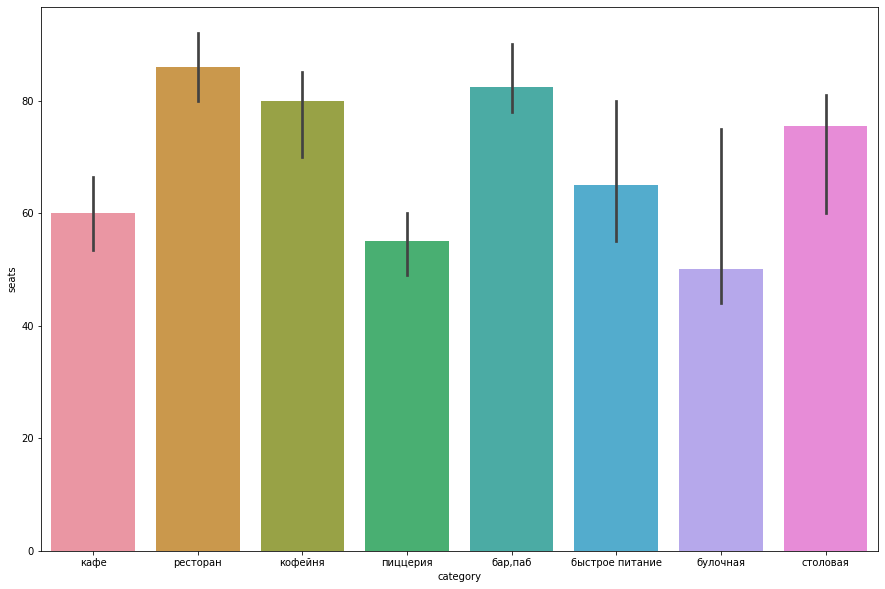

In [14]:
#анализируем количество посадочных мест в заведениях по категориям
with plt.style.context('seaborn-muted'):
    plt.figure(figsize=(15, 10))
    ax = sns.barplot(x='category', y='seats', data=data, estimator=median)

Диапазон количества посадочных мест заведений по категориям очень широкий, на это указывает значительное расхождение среднего и медианного рассчитанных значений количества посадочных мест. Наиболее вместительными по медианному значению являются рестораны, наименее вместительными - булочные. Визуализация также проведена с использованием медианного значения.

#### Сетевые и несетевые заведений

In [15]:
#анализируем количество заведений по принадлежности к сетям
chainGB = data.groupby('chain').agg({'name':['count']}).reset_index()
chainGB.columns = ['chain','count']
chainGB = chainGB.sort_values(by='count', ascending=False).reset_index(drop=True)
chainGB = chainGB.replace(0, 'несетевое заведение')
chainGB = chainGB.replace(1, 'сетевое заведение')
display(chainGB)

,chain,count
0,несетевое заведение,5201
1,сетевое заведение,3205


In [16]:
#строим график по принадлежности к сети
fig = go.Figure(data=[go.Pie(labels=chainGB['chain'], values=chainGB['count'])])
fig.update_layout(
    title="Количество заведений по принадлежности к сети",
    title_x = 0.5,
    xaxis_title="Принадлежность",
    yaxis_title="Количество")
fig.show()

Исходя из имеющейся информации, большинство заведений, представленных в датасете являются несетевыми - 62%.

#### Категории сетевых заведений

In [17]:
#анализируем количество заведений по принадлежности к сетям по категориям
chain_pivot = data.pivot_table(index='category', columns='chain', values='name', aggfunc = 'count').reset_index()
chain_pivot.columns = ['category','non-chain','chain']
chain_pivot['all'] = chain_pivot['non-chain'] + chain_pivot['chain']
chain_pivot['non-chain_%'] = round(chain_pivot['non-chain']*100/chain_pivot['all'],2)
chain_pivot['chain_%'] = round(chain_pivot['chain']*100/chain_pivot['all'],2)

In [18]:
display(chain_pivot)

,category,non-chain,chain,all,non-chain_%,chain_%
0,"бар,паб",596,169,765,77.91,22.09
1,булочная,99,157,256,38.67,61.33
2,быстрое питание,371,232,603,61.53,38.47
3,кафе,1599,779,2378,67.24,32.76
4,кофейня,693,720,1413,49.04,50.96
5,пиццерия,303,330,633,47.87,52.13
6,ресторан,1313,730,2043,64.27,35.73
7,столовая,227,88,315,72.06,27.94


In [19]:
#строим график заведений по принадлежности к сети по категориям
fig = px.bar(chain_pivot, x='category', y=['non-chain', 'chain'])
fig.update_layout(
    title="Количество заведений по принадлежности к сети по категориям",
    title_x = 0.5,
    xaxis_title="Категории",
    yaxis_title="Количество")
fig.show()

Сетевых заведений общественного питания в относительном измерении больше всего по категориям булочная, кофейня и пиццерия. Меньше всего сетевых заведений общепита по категориям бар,паб, столовая, кафе, ресторан, быстрое питание.

#### Топ-15 популярных сетей

In [20]:
#выбираем сетевые заведения
data_chain = data.query('chain == 1')

In [21]:
#строим сводную таблицу и сортируем по убыванию
data_chain = data_chain.pivot_table(index=['name','category'], values='chain', aggfunc = 'count').sort_values(by='chain', ascending=False).reset_index()
display(data_chain.head(15))

,name,category,chain
0,Шоколадница,кофейня,119
1,Домино'с Пицца,пиццерия,76
2,Додо Пицца,пиццерия,74
3,One Price Coffee,кофейня,71
4,Яндекс Лавка,ресторан,69
5,Cofix,кофейня,65
6,Prime,ресторан,49
7,КОФЕПОРТ,кофейня,42
8,Кулинарная лавка братьев Караваевых,кафе,39
9,Теремок,ресторан,36


In [44]:
data_chain_15 = data_chain.query('chain >= 22')
data_chain_15['category'].value_counts()

кофейня     6
ресторан    3
кафе        3
пиццерия    2
булочная    1
Name: category, dtype: int64

Среди топ-15 сетевых заведений, есть достаточно известные не только в Москве, но и в России. Преобладают сети кофеен - 6, ресторанов - 3, кафе - 3, пиццерий - 2, также в топ-15 вошла одна сеть булочных.

In [22]:
#строим график заведений по количеству
fig = px.bar(data_chain_15, x='name', y='chain')
fig.update_layout(
    title="Количество сетевых заведений",
    title_x = 0.5,
    xaxis_title="Наименование",
    yaxis_title="Количество")
fig.show()

#### Распределение заведений по административным районам

In [23]:
#строим сводную таблицу по административным округам
data_dtr = data.pivot_table(index='district', columns='category', values='name', aggfunc = 'count').reset_index()
data_dtr['all'] = data_dtr['бар,паб']+data_dtr['булочная']+data_dtr['быстрое питание']+data_dtr['кафе']+data_dtr['кофейня']+data_dtr['пиццерия']+data_dtr['ресторан']+data_dtr['столовая']
display(data_dtr.sort_values(by='all', ascending=False).reset_index(drop=True))

category,district,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,all
0,Центральный административный округ,364,50,87,464,428,113,670,66,2242
1,Северный административный округ,68,39,58,235,193,77,189,41,900
2,Южный административный округ,68,25,85,264,131,73,202,44,892
3,Северо-Восточный административный округ,63,28,82,269,159,68,182,40,891
4,Западный административный округ,50,37,62,239,150,71,218,24,851
5,Восточный административный округ,53,25,71,272,105,72,160,40,798
6,Юго-Восточный административный округ,38,13,67,282,89,55,145,25,714
7,Юго-Западный административный округ,38,27,61,238,96,64,168,17,709
8,Северо-Западный административный округ,23,12,30,115,62,40,109,18,409


В датасете присутствуют все административные округа Москвы. Наибольшее количество заведений общественного питания сосредоточено в Центральном АО, наименьшее в Северо-Западном АО.

In [24]:
fig = px.bar(data_dtr, x='district', y=['бар,паб','булочная','быстрое питание','кафе','кофейня','пиццерия','ресторан','столовая'])
fig.update_layout(
    title="Количество заведений по принадлежности к сети по категориям",
    title_x = 0.5,
    xaxis_title="Наименование",
    yaxis_title="Количество")
fig.show()

#### Различие в средних рейтингах

In [25]:
#строим сводную таблицу по средним рейтингам заведений
data_rt = data.pivot_table(index='category', values='rating', aggfunc = 'mean').round(2).reset_index()
display(data_rt)

,category,rating
0,"бар,паб",4.39
1,булочная,4.27
2,быстрое питание,4.05
3,кафе,4.12
4,кофейня,4.28
5,пиццерия,4.30
6,ресторан,4.29
7,столовая,4.21


In [53]:
#строим график заведений по среднему рейтингу
fig = px.bar(data_rt, x='category', y='rating', range_y=[4, 4.5])
fig.update_layout(
    title="Средний рейтинг заведений по категориям",
    title_x = 0.5,
    xaxis_title="Категория",
    yaxis_title="Средний рейтинг")
fig.show()

In [26]:
display(round((data_rt['rating'].max()-data_rt['rating'].min())*100/data_rt['rating'].max(),2))

7.74

Усредненные рейтинги заведений различных категорий общепита различаются незначительно. Различие между максимальным и минимальным значением усредненного рейтинга не превышает 8%.

#### Рейтинги заведений по административным районам

In [27]:
#строим сводную таблицу по рейтингам заведений
data_rt_dtr = data.pivot_table(index='district', values='rating', aggfunc = 'mean').round(2).reset_index()
display(data_rt_dtr)

,district,rating
0,Восточный административный округ,4.17
1,Западный административный округ,4.18
2,Северный административный округ,4.24
3,Северо-Восточный административный округ,4.15
4,Северо-Западный административный округ,4.21
5,Центральный административный округ,4.38
6,Юго-Восточный административный округ,4.10
7,Юго-Западный административный округ,4.17
8,Южный административный округ,4.18


#### Фоновая картограма (хороплет) со средним рейтингом заведений по районам

In [28]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=data_rt_dtr,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='Reds',
    fill_opacity=0.6,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)
# выводим карту
m

#### Отображение всех заведений на карте

In [29]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

#### Топ-15 улиц по количеству заведений

In [63]:
#строим сводную таблицу по улицам
data_str = data.pivot_table(index=['street','district'], columns='category', values='name', aggfunc = 'count').reset_index()
data_str = data_str.fillna(0)
data_str['all'] = data_str['бар,паб']+data_str['булочная']+data_str['быстрое питание']+data_str['кафе']+data_str['кофейня']+data_str['пиццерия']+data_str['ресторан']+data_str['столовая']
display(data_str.sort_values(by='all', ascending=False).reset_index(drop=True).head(15))

category,street,district,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,all
0,проспект Мира,Северо-Восточный административный округ,9.0,3.0,16.0,41.0,19.0,8.0,34.0,2.0,132.0
1,Профсоюзная улица,Юго-Западный административный округ,6.0,4.0,15.0,35.0,18.0,15.0,26.0,3.0,122.0
2,Ленинградский проспект,Северный административный округ,15.0,4.0,2.0,12.0,25.0,9.0,25.0,3.0,95.0
3,проспект Вернадского,Западный административный округ,6.0,1.0,11.0,22.0,16.0,9.0,29.0,1.0,95.0
4,Каширское шоссе,Южный административный округ,2.0,0.0,10.0,20.0,16.0,5.0,19.0,5.0,77.0
5,Варшавское шоссе,Южный административный округ,6.0,0.0,7.0,17.0,14.0,4.0,20.0,7.0,75.0
6,Ленинградское шоссе,Северный административный округ,5.0,2.0,5.0,13.0,13.0,3.0,25.0,3.0,69.0
7,Ленинский проспект,Юго-Западный административный округ,5.0,2.0,2.0,18.0,18.0,5.0,15.0,1.0,66.0
8,Дмитровское шоссе,Северный административный округ,5.0,2.0,5.0,17.0,7.0,6.0,19.0,4.0,65.0
9,Люблинская улица,Юго-Восточный административный округ,5.0,0.0,5.0,26.0,11.0,1.0,10.0,2.0,60.0


In [65]:
data_str_15 = data_str.query('all >= 47')
fig = px.bar(data_str_15, x='street', y=['бар,паб','булочная','быстрое питание','кафе','кофейня','пиццерия','ресторан','столовая'])
fig.update_layout(
    title="Количество заведений на улице по категориям",
    title_x = 0.5,
    xaxis_title="Наименование",
    yaxis_title="Количество")
fig.show()

In [83]:
display(data_str_15['district'].value_counts())

Северный административный округ            3
Юго-Западный административный округ        3
Западный административный округ            2
Центральный административный округ         2
Северо-Восточный административный округ    2
Южный административный округ               2
Юго-Восточный административный округ       1
Name: district, dtype: int64

Наибольшее количество, по три улицы из топ-15 по количеству заведений общепита расположено в САО и ЮЗАО. По две улицы представлено в ЗАО, ЦАО, СВАО,ЮАО. Одна улица расположена в ЮВАО. Как правило, все эти улицы очень протяженные и имеют наименование проспект или шоссе.

In [66]:
data_str_1 = data_str.query('all == 1')
display(data_str_1['street'].nunique())
display(data_str_1.head())

430

category,street,district,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,all
0,1-й Автозаводский проезд,Южный административный округ,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
1,1-й Балтийский переулок,Северный административный округ,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0
2,1-й Варшавский проезд,Южный административный округ,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
3,1-й Вешняковский проезд,Юго-Восточный административный округ,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
5,1-й Голутвинский переулок,Центральный административный округ,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


В датасете пристутствуют 430 улиц, на которых расположен единственный объект общепита. Про эти заведения можно сказать, что они расположены в отдалении от конкурентов, но при этом место расположения этих объектов не является привлекательным.

#### Средние чеки заведений

In [80]:
#строим сводную таблицу по средним чекам заведений
data_bill = data.pivot_table(index='district', values='middle_avg_bill', aggfunc = 'median').round(2).reset_index()
display(data_bill.sort_values(by='middle_avg_bill', ascending=False))

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [81]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=data_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='Reds',
    fill_opacity=0.6,
    legend_name='Средний чек заведений по районам',
).add_to(m)
# выводим карту
m

Исходя из полученных результатов, можно сказать, что удаленность до центра не оказывает явного влияния на  цены в заведениях. При явном влиянии, все административные округи расположенные вокруг ЦАО, имели бы более низкое значение медианного значения среднего чека. В нашем случае есть ЗАО, в котором медианное значение среднего чека равно значению ЦАО.

### Вывод по анализу заведений общественного питания

- В исходном файле представлена информация о 8406 заведениях общепита в Москве. Для всех заведений указаны наименование, категория, адрес, район, координаты, рейтинг и принадлежность к сети.
- Среди всех заведений общественного питания больше всего кафе - 2378, ресторанов - 2043, кофеен 1413, баров, пабов - 765, пиццерий - 633, заведений быстрого питания - 603, столовых - 315. Наименьшее количество булочных - 256 заведений из общего количества 8406.
- Диапазон количества посадочных мест заведений по категориям очень широкий, на это указывает значительное расхождение среднего и медианного рассчитанных значений количества посадочных мест. Наиболее вместительными по медианному значению являются рестораны, наименее вместительными - булочные.
- Исходя из имеющейся информации, большинство заведений, представленных в датасете являются несетевыми - 62%.
- Среди топ-15 сетевых заведений, есть достаточно известные не только в Москве, но и в России. Преобладают сети кофеен - 6, ресторанов - 3, кафе - 3, пиццерий - 2, также в топ-15 вошла одна сеть булочных.
- В датасете присутствуют все административные округа Москвы. Наибольшее количество заведений общественного питания сосредоточено в Центральном АО, наименьшее в Северо-Западном АО.
- Усредненные рейтинги заведений различных категорий общепита различаются незначительно. Различие между максимальным и минимальным значением усредненного рейтинга не превышает 8%.
- Наибольшее количество, по три улицы из топ-15 по количеству заведений общепита расположено в САО и ЮЗАО. По две улицы представлено в ЗАО, ЦАО, СВАО,ЮАО. Одна улица расположена в ЮВАО. Как правило, все эти улицы очень протяженные и имеют наименование проспект или шоссе.
- Исходя из полученных результатов, можно сказать, что удаленность до центра не оказывает явного влияния на  цены в заведениях. При явном влиянии, все административные округи расположенные вокруг ЦАО, имели бы более низкое значение медианного значения среднего чека. В нашем случае есть ЗАО, в котором медианное значение среднего чека равно значению ЦАО.

### Анализ данных по кофейням

In [35]:
data_coffee = data.query('category == "кофейня"')
display(data_coffee.head())

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
25,В парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,NaN,False
45,9 Bar Coffee,кофейня,"Москва, Коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.885837,37.513422,4.0,NaN,NaN,NaN,NaN,1,46.0,Коровинское шоссе,False
46,CofeFest,кофейня,"Москва, улица Маршала Федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,NaN,NaN,NaN,NaN,1,NaN,улица Маршала Федоренко,False
52,Cofix,кофейня,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",55.878531,37.479395,3.8,NaN,NaN,NaN,NaN,1,NaN,улица Дыбенко,False


#### Распределение кофеен по административным районам

In [ ]:
data_dtr_coffee = data_dtr.loc[:,['district','кофейня']]
data_dtr_coffee = data_dtr_coffee.sort_values(by='кофейня',ascending=False).reset_index(drop=True)

In [ ]:
data_dtr_coffee['%'] = round(data_dtr_coffee['district']/sum(data_dtr_coffee['кофейня'])*100,2)
display(data_dtr_coffee)

In [ ]:
#moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data_coffee.apply(create_clusters, axis=1)

# выводим карту
m

#### Кофейни 24/7

In [86]:
data_coffee_24 = data_coffee.query('is_24 == "True"')
data_coffee_24['lat'].nunique()

59

In [39]:
#moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data_coffee_24.apply(create_clusters, axis=1)

# выводим карту
m

#### Рейтинги кофеен и распределение по районам

In [40]:
#строим сводную таблицу по рейтингам заведений
data_rt_dtr = data_coffee.pivot_table(index='district', values='rating', aggfunc = 'mean').round(2).reset_index()
display(data_rt_dtr)

,district,rating
0,Восточный административный округ,4.28
1,Западный административный округ,4.20
2,Северный административный округ,4.29
3,Северо-Восточный административный округ,4.22
4,Северо-Западный административный округ,4.33
5,Центральный административный округ,4.34
6,Юго-Восточный административный округ,4.23
7,Юго-Западный административный округ,4.28
8,Южный административный округ,4.23


#### Стоимость чашки капучино

In [41]:
data_coffee['middle_coffee_cup'].describe()

count     521.000000
mean      175.055662
std        89.753009
min        60.000000
25%       124.000000
50%       170.000000
75%       225.000000
max      1568.000000
Name: middle_coffee_cup, dtype: float64

### Вывод по разделу кофеен

- В датасете представлено 1413 кофеен, в основном эти заведения расположены в Центральном АО